# Setup code



In [ ]:
%load_ext autoreload
%autoreload 2
import os
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
GOOGLE_DRIVE_PATH_AFTER_MYDRIVE = 'EECS 498/Final Project'
GOOGLE_DRIVE_PATH = os.path.join('drive', 'My Drive', GOOGLE_DRIVE_PATH_AFTER_MYDRIVE)
print(os.listdir(GOOGLE_DRIVE_PATH))

['.ipynb_checkpoints', 'models', '__pycache__', 'clickbait', 'nonclickbait', 'data.py', 'utils.py', 'engine.py']


In [ ]:
import sys
sys.path.append(GOOGLE_DRIVE_PATH)

In [ ]:
!pip install models
!pip install torchmetrics

  Using cached models-0.9.3.tar.gz (16 kB)
  Using cached models-0.9.2.tar.gz (16 kB)
  Using cached models-0.9.1.tar.gz (16 kB)
  Using cached models-0.9.0.tar.gz (14 kB)
  Using cached models-0.8.0.tar.gz (14 kB)
  Using cached models-0.7.0.tar.gz (14 kB)
  Using cached models-0.4.0.tar.gz (11 kB)
  Using cached models-0.3.0.tar.gz (11 kB)
  Using cached models-0.2.0.tar.gz (11 kB)
  Using cached models-0.1.1.tar.gz (11 kB)
  Using cached models-0.1.0.tar.gz (11 kB)
  Using cached models-0.0.5.tar.gz (6.4 kB)
  Using cached models-0.0.4.tar.gz (6.1 kB)
  Using cached models-0.0.3.tar.gz (6.2 kB)
ERROR: Could not find a version that satisfies the requirement models (from versions: 0.0.3, 0.0.4, 0.0.5, 0.1.0, 0.1.1, 0.2.0, 0.3.0, 0.4.0, 0.7.0, 0.8.0, 0.9.0, 0.9.1, 0.9.2, 0.9.3)
ERROR: No matching distribution found for models


#Introduction


> YouTube is one of the most popular video sharing platforms. With creators around the globe, there are millions of uploads every day. There is almost no limit (except for copy right music and explicit content) to the kind of videos uploaded. However, as monetization of these videos has rapidly increased over time, so has the rampant use of clickbait thumbnails.


> Since a video’s revenue is directly related to the number of clicks, creators often design incredibly deceptive or outlandish thumbnails as a desperate attempt to maximize the amount of traffic for their video. These techniques include anything from using over-the-top facial expressions, large amounts of text deceptively teasing the video’s contents, or any sort of highly manufactured editing that aims to catch as many eyes as possible.


> As people who are annoyed by these greedy creators and low effort content, we’re looking for a way to filter out videos with clickbait thumbnails to provide a way to only view videos from authentic creators. With skills gained from this course, we aim to build a classification model that can identify clickbait thumbnails for our final project, referred to as "anti-clickbait-thumbnail 3000."


> However, including every type of thumbnail in our clickbait thumbnail classification dataset has proven to be too big of a task. There’s too much subjectivity in identifying clickbait for a random sample of YouTube thumbnails, since there are way too many factors to consider. Therefore, we narrow our scope to thumbnails that contain people's faces on it to provide easier comparison for our data collection. Since the line between clickbait and non-clickbait thumbnails is blurry and arbitrary (since it depends entirely on our own definition), we aim to select thumbnails of more extreme examples as datapoints included in the dataset. As a result, our dataset would be consisted of fine-grained categories that are mutually exclusive.




#Dataset

> Our dataset includes 100 images for both “clickbait” and “non-clickbait” YouTube thumbnails. In order to create a consistent distinction between the two labels, we need to establish a definition for clickbait, especially since it’s a description that can be very subjective. We define clickbait as thumbnails including deceptive or highly edited images aimed at attracting users to click on the video. Non-clickbait include standard thumbnails, such as a still frame from the video or even a simple cover image with a basic caption. As previously mentioned, we also decided to narrow down these categories to only images including human faces. This decision aimed to reduce the amount of subjectivity in our labels, since these types of thumbnails fit more clearly into either category at least to the human eye, providing us more confidence in our labels.



> (Note that even though facial expressions can be a good indicator, both clickbait and non-clickbait thumbnails can often have similar expressions, so it’s not the defining factor between the two labels)

> These images were manually collected from a YouTube account with no user history. This account allowed us to retrieve thumbnails from a generalized user feed ranging across several different genres, since the YouTube recommendation algorithm had no previous data from the account’s watch history. Additionally, we looked to have a wide variety of demographics represented in our dataset in an effort to avoid any hidden bias in our model towards certain groups. We also made sure to avoid including more than 2 thumbnails per channel. This decision allows our model to learn from a wide variety of clickbait techniques and doesn’t gain too much information from a single person’s likeness. 





In [ ]:
import torch
from pathlib import Path
from torch.utils.data import DataLoader
from data import ThumbNail, collate_fn, split_dataset, class_balance_check


CLICKBAIT_PATH = Path(GOOGLE_DRIVE_PATH)/'clickbait'
NONCLICKBAIT_PATH = Path(GOOGLE_DRIVE_PATH)/'nonclickbait'
thumnail_dataset = ThumbNail(CLICKBAIT_PATH, NONCLICKBAIT_PATH)

print(f"Total datapoints within dataset: {len(thumnail_dataset)}")

train_set, val_set, test_set = split_dataset(thumnail_dataset)
print(f"Train set: {len(train_set)}")
print(f"Val set: {len(val_set)}")
print(f"test set: {len(test_set)}")


class_balance_check(train_set)
class_balance_check(val_set)
class_balance_check(test_set)

Total datapoints within dataset: 200
Train set: 140
Val set: 20
test set: 40
Counter({1: 71, 0: 69})
Counter({0: 10, 1: 10})
Counter({1: 21, 0: 19})


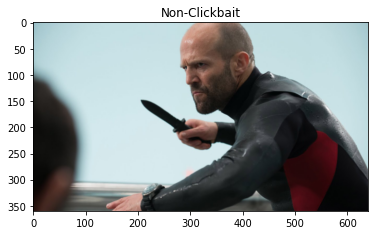

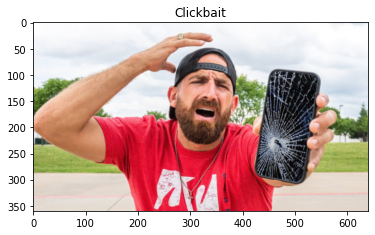

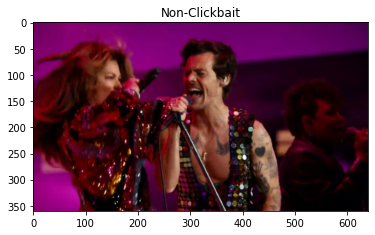

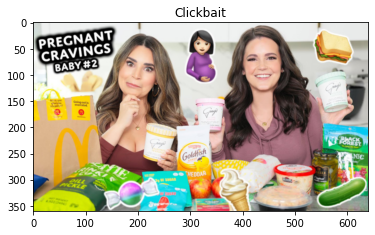

<Figure size 432x288 with 0 Axes>

In [ ]:
from utils import show_examples
show_examples(thumnail_dataset, 4)

#Method

> For our model selection, we decided to select model of similar sizes and measure their performance with respect to three training methods. These methods include: (1) training from scratch, (2) using a pretrain backbone and freezing it as a feature extractor, and (3) fine tuning the entire model.

> Our model selection includes ResNet50 and RegNetY3.2GF, which has parameters size 22.6 and 19.4 million parameters respectively. We are using ResNet because it is still a very effective model for image classification problems, and we are using RegNet because it is a newer model from a architecture designing space paper (https://arxiv.org/pdf/2003.13678.pdf) that has a similar size.

> With 2 model architectures and 3 training procedures, we aim to produce 6 different models combination and compare their performances accordingly. For all our models, we extract the backbone from torchvision models, and attach it to another single fully connected layer to make prediction. We are using standard cross entropy loss and accuracy to measure the model performance.

In [162]:
import torch
from data import batch_cifar
from engine import train_model
from utils import get_adam_optimizer
from models.resnet import resnet50
from models.regnet import regnety_3_2_gf
from torchvision.datasets import CIFAR10
from torch.utils.data import random_split, DataLoader

dataset = CIFAR10('.', download=True)
overfit_dataset, _ = random_split(dataset, [200, 50000-200])

Files already downloaded and verified


## Resnet50 Sanity Check

Making sure the model is running correctly and model with feature extractor mode freeze the backbone.

In [170]:
# Sanity check for train from scratch model
# All parameters are unfreezed

model = resnet50(10, False, False, False)
# this block shouldnt print anything
for name, param in model.named_parameters():
    if not param.requires_grad:
        print(name, " is frozen!")

# Sanity check for loss of a randomly initialized model
dummy = torch.rand((32, 3, 64, 64))
target = torch.randint(0, 10, (32,))
model.train()
loss = model(dummy, target)
print(loss) # close to 2.3

tensor(2.3437, grad_fn=<NllLossBackward0>)


Overfitting the model on CIFAR10

Should be close to 100% acc at the end

epoch 0
	 train loss: 3.2428 	 train acc: 0.0750 	 val loss: 2.4464 	 val acc: 0.0750
epoch 1
	 train loss: 3.2200 	 train acc: 0.0800 	 val loss: 1.6549 	 val acc: 0.0800
epoch 2
	 train loss: 2.0082 	 train acc: 0.1700 	 val loss: 1.2659 	 val acc: 0.1700
epoch 3
	 train loss: 1.6478 	 train acc: 0.4250 	 val loss: 0.7252 	 val acc: 0.4250
epoch 4
	 train loss: 0.8215 	 train acc: 0.7800 	 val loss: 0.2481 	 val acc: 0.7800
epoch 5
	 train loss: 0.2632 	 train acc: 0.8450 	 val loss: 0.0631 	 val acc: 0.8450
epoch 6
	 train loss: 0.0730 	 train acc: 0.8950 	 val loss: 0.0157 	 val acc: 0.8950
epoch 7
	 train loss: 0.0215 	 train acc: 0.9000 	 val loss: 0.0106 	 val acc: 0.9000
epoch 8
	 train loss: 0.0139 	 train acc: 0.8900 	 val loss: 0.0075 	 val acc: 0.8900
epoch 9
	 train loss: 0.0261 	 train acc: 0.8800 	 val loss: 0.1312 	 val acc: 0.8800
epoch 10
	 train loss: 0.1273 	 train acc: 0.8700 	 val loss: 0.0569 	 val acc: 0.8700
epoch 11
	 train loss: 0.0591 	 train acc: 0.8800 	 v

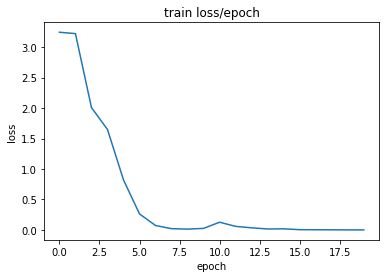

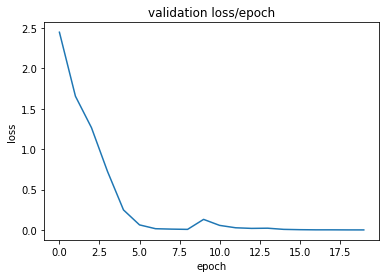

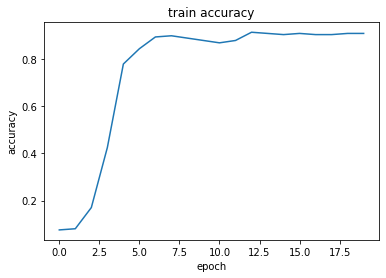

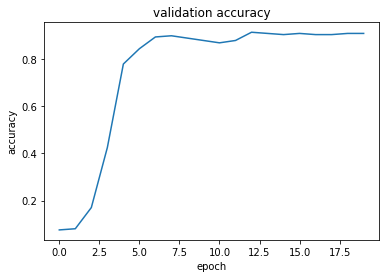

In [178]:
# Change these to overfit
overfit_batch_size = 32
overfit_lr = 0.001
overfit_weight_decay = 0

overfit_model = resnet50(10, False, False, False)
overfit_optimizer = get_adam_optimizer(overfit_model, overfit_lr, overfit_weight_decay)
overfit_loader = DataLoader(overfit_dataset, overfit_batch_size, collate_fn=batch_cifar)

train_loss, val_loss = train_model(
    overfit_model,
    overfit_loader,
    overfit_loader,
    overfit_loader,
    overfit_optimizer, 10, 20)

In [172]:
# Sanity check for feature extractor model
# All parameters in the backbone should be frozen
model = resnet50(10, True, True, False)
# Only the last layer should be printed
for name, param in model.named_parameters():
    if param.requires_grad:
        print(name)

cls_head.weight
cls_head.bias


## Regnet Sanity Check

Making sure the model is running correctly and model with feature extractor mode freeze the backbone.

In [181]:
# Sanity check for train from scratch model
# All parameters are unfreezed
model = regnety_3_2_gf(10, False, False, False)
# this block shouldnt print anything
for name, param in model.named_parameters():
    if not param.requires_grad:
        print(name, " is frozen!")

# Sanity check for loss of a randomly initialized model
dummy = torch.rand((32, 3, 64, 64))
target = torch.randint(0, 10, (32,))
model.train()
loss = model(dummy, target)
print(loss) # close to 2.3

tensor(2.3210, grad_fn=<NllLossBackward0>)


Overfitting the model on a subset of CIFAR10

Should be close to 100% acc at the end

epoch 0
	 train loss: 3.4019 	 train acc: 0.1050 	 val loss: 2.4343 	 val acc: 0.1050
epoch 1
	 train loss: 2.4108 	 train acc: 0.1050 	 val loss: 1.9946 	 val acc: 0.1050
epoch 2
	 train loss: 2.0295 	 train acc: 0.1400 	 val loss: 1.6761 	 val acc: 0.1400
epoch 3
	 train loss: 1.5817 	 train acc: 0.4550 	 val loss: 0.9765 	 val acc: 0.4550
epoch 4
	 train loss: 0.8641 	 train acc: 0.8050 	 val loss: 0.2159 	 val acc: 0.8050
epoch 5
	 train loss: 0.2907 	 train acc: 0.9000 	 val loss: 0.2076 	 val acc: 0.9000
epoch 6
	 train loss: 0.2251 	 train acc: 0.9350 	 val loss: 0.0593 	 val acc: 0.9350
epoch 7
	 train loss: 0.1200 	 train acc: 0.9450 	 val loss: 0.0733 	 val acc: 0.9450
epoch 8
	 train loss: 0.0982 	 train acc: 0.9500 	 val loss: 0.0227 	 val acc: 0.9500
epoch 9
	 train loss: 0.0935 	 train acc: 0.9000 	 val loss: 0.0774 	 val acc: 0.9000
epoch 10
	 train loss: 0.1605 	 train acc: 0.9300 	 val loss: 0.0671 	 val acc: 0.9300
epoch 11
	 train loss: 0.1859 	 train acc: 0.8500 	 v

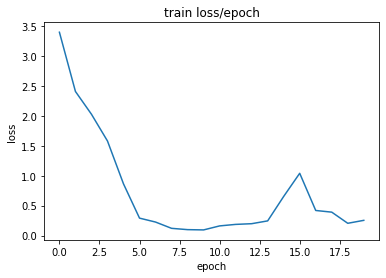

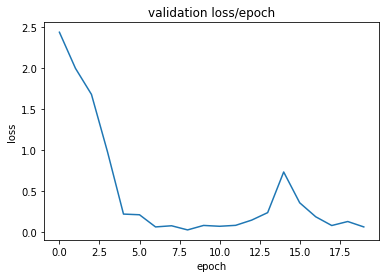

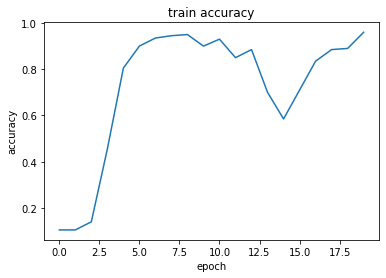

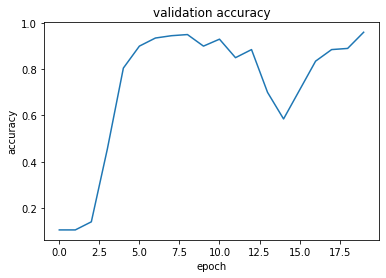

In [183]:
# Change these to overfit
overfit_batch_size = 32
overfit_lr = 0.002
overfit_weight_decay = 0

overfit_model = regnety_3_2_gf(10, False, False, False)
overfit_optimizer = get_adam_optimizer(overfit_model, overfit_lr, overfit_weight_decay)
overfit_loader = DataLoader(overfit_dataset, overfit_batch_size, collate_fn=batch_cifar)

train_loss, val_loss = train_model(overfit_model, overfit_loader, overfit_loader, overfit_loader, overfit_optimizer, 10, 20)

In [184]:
# Sanity check for feature extractor model
# All parameters in the backbone should be frozen
model = regnety_3_2_gf(10, True, True, False)
# Only the last layer should be printed
for name, param in model.named_parameters():
    if param.requires_grad:
        print(name)

cls_head.weight
cls_head.bias


#Experiments

> As describe above, there are 2 based model and 3 training methods, making 6 different models combination. For each of the combination, we are doing a hyperparameter search in learning rate, learning rate decay, and batch size. We would use the last epoch accuracy with respect to the validation dataset as a metric to decide which set of hyper parameter to use.

> Then we use the best hyperparameter found in the validation dataset and use them as hyperparameter for trainig the model with training dataset. We also print out the training loss, training accuracy, validation loss, validation accuracy every epoch during training.

> When the model finish training, we would use the test set to evaluate the model performance using the model at epoch with the lowest validation loss.

In [ ]:
# Some import neccessary for the following cells
import models
from pathlib import Path
from data import collate_fn
from utils import get_dataloader, get_hyper_parameters
from engine import get_adam_optimizer, train_model, hyper_parameters_search, evaluate

## Experiment 1

ResNet50 + train from scratch

### Hyperparameter Tuning

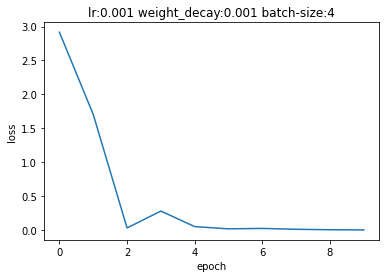

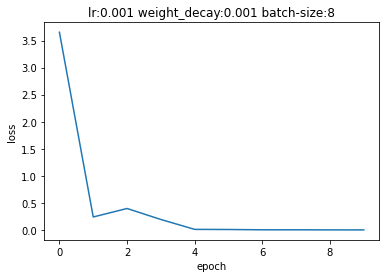

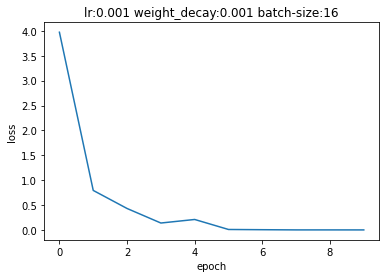

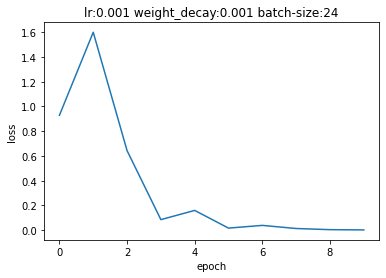

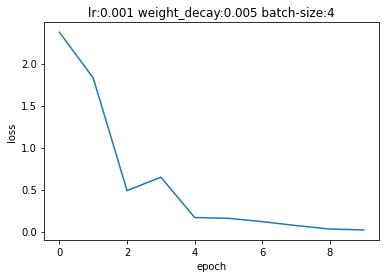

...

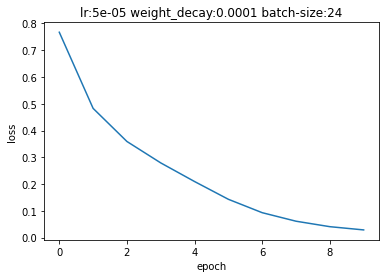

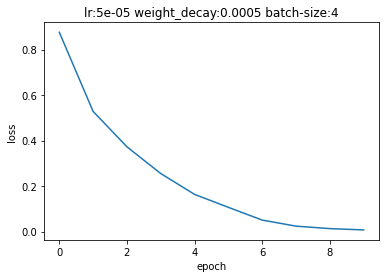

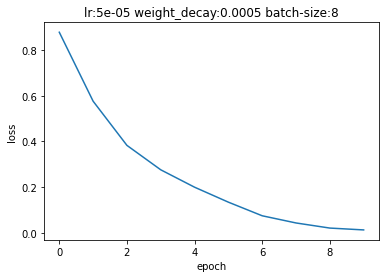

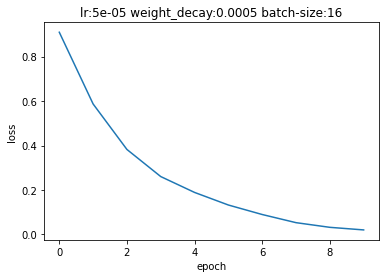

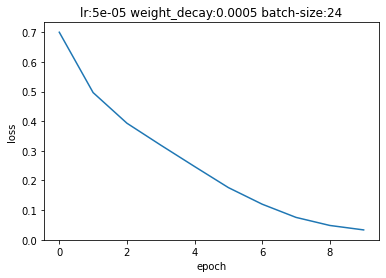

In [ ]:
model_name = 'resnet50'
num_class = 2
pretrained = False
feature_extractor = False
progress = True
# Hyperparameter
hyperparameters = get_hyper_parameters()
validation_epoch = 10

lr, weight_decay, batch_size = hyper_parameters_search(
    model_name,
    num_class,
    pretrained,
    feature_extractor,
    progress,
    hyperparameters,
    val_set,
    validation_epoch)

In [ ]:
print(lr, weight_decay, batch_size)

0.005 0.0005 4


### Training

epoch 0
	 train loss: 1.3179 	 train acc: 0.4714 	 val loss: 0.4565 	 val acc: 0.5000
epoch 1
	 train loss: 1.2516 	 train acc: 0.7071 	 val loss: 0.7737 	 val acc: 0.9000
epoch 2
	 train loss: 0.9134 	 train acc: 0.7071 	 val loss: 0.4604 	 val acc: 0.6500
epoch 3
	 train loss: 0.7826 	 train acc: 0.6786 	 val loss: 0.6286 	 val acc: 0.6000
epoch 4
	 train loss: 0.8422 	 train acc: 0.4500 	 val loss: 1.0954 	 val acc: 0.4000
epoch 5
	 train loss: 0.7088 	 train acc: 0.5357 	 val loss: 0.5575 	 val acc: 0.5500
epoch 6
	 train loss: 0.6836 	 train acc: 0.5857 	 val loss: 0.5638 	 val acc: 0.7000
epoch 7
	 train loss: 0.6155 	 train acc: 0.6571 	 val loss: 0.6211 	 val acc: 0.5500
epoch 8
	 train loss: 0.6015 	 train acc: 0.7214 	 val loss: 0.4766 	 val acc: 0.8500
epoch 9
	 train loss: 0.6159 	 train acc: 0.7429 	 val loss: 0.5391 	 val acc: 0.6000
epoch 10
	 train loss: 0.5779 	 train acc: 0.7429 	 val loss: 0.6073 	 val acc: 0.9000
epoch 11
	 train loss: 0.6196 	 train acc: 0.4929 	 v

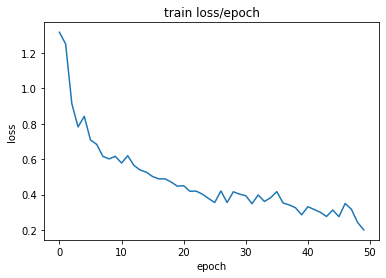

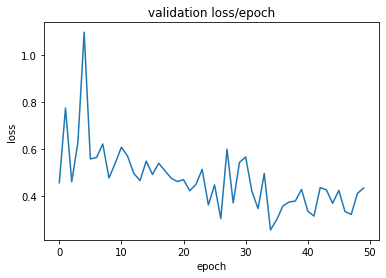

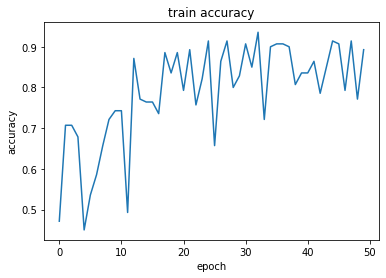

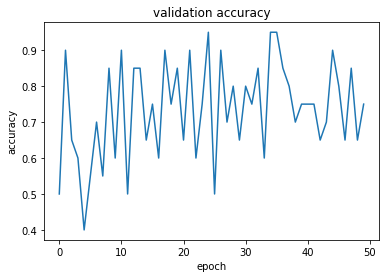

In [ ]:
model = models.__dict__[model_name](
    num_class, pretrained, feature_extractor, progress)

optimizer = get_adam_optimizer(model, lr, weight_decay)

train_loader, val_loader, test_loader = get_dataloader(
    train_set, val_set, test_set, batch_size, collate_fn)

# Training function argument
save_path = Path('./resnet50-from-scratch')
training_epoch = 50

train_loss, val_loss = train_model(
    model,
    train_loader,
    val_loader,
    test_loader,
    optimizer,
    num_class,
    training_epoch,
    save_path
)

### Testing

In [ ]:
# Get the best epoch model in term of valiation loss
lowest_val_loss_epoch = torch.argmin(torch.tensor(val_loss)).item()

# Creating model, load state_dict, and move to cuda
test_model = models.__dict__[model_name](
    num_class, pretrained, feature_extractor, progress)
state_dict = torch.load(save_path/f'epoch-{lowest_val_loss_epoch}.pth')
test_model.load_state_dict(state_dict)
test_model.cuda()

# Evaluate
accuracy, f1 = evaluate(test_model, test_loader, num_class)
print(f"accuracy: {accuracy}, f1:{f1}")
# Save Best model
torch.save(test_model.state_dict(), str(save_path/f'best_model.pth'))

accuracy: 0.824999988079071, f1:0.8248906135559082


## Experiment 2

ResNet50 + feature extractor

### Hyperparameter tuning

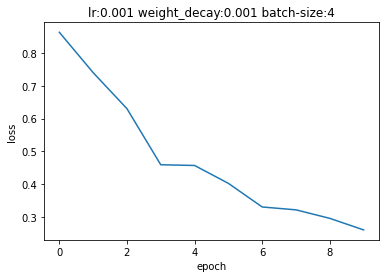

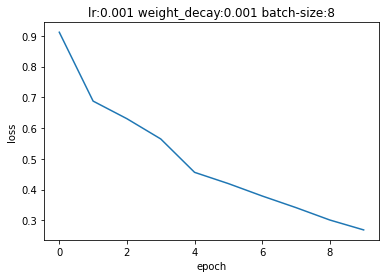

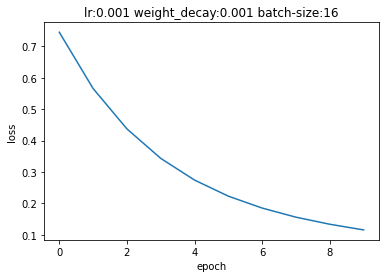

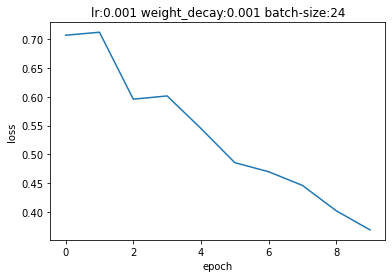

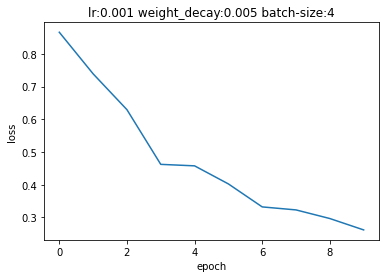

...

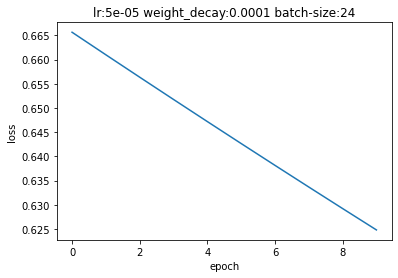

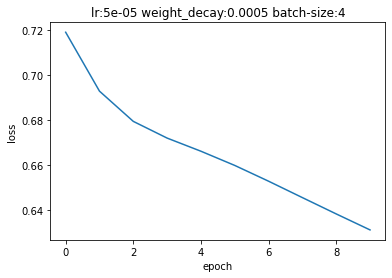

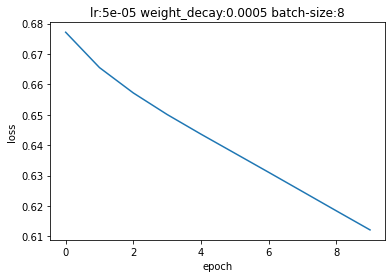

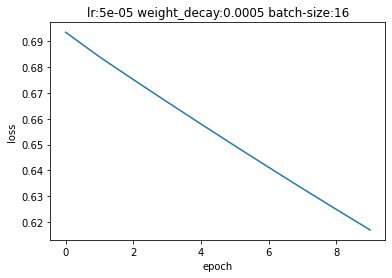

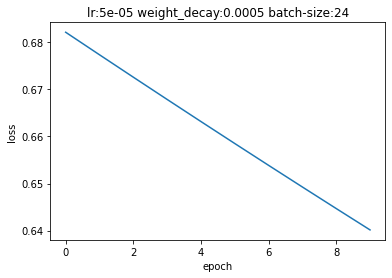

In [ ]:
model_name = 'resnet50'
num_class = 2
pretrained = True
feature_extractor = True
progress = True
# Hyperparameter
hyperparameters = get_hyper_parameters()
validation_epoch = 10

lr, weight_decay, batch_size = hyper_parameters_search(
    model_name,
    num_class,
    pretrained,
    feature_extractor,
    progress,
    hyperparameters,
    val_set,
    validation_epoch)

In [ ]:
print(lr, weight_decay, batch_size)

0.0005 0.0005 8


### Training

epoch 0
	 train loss: 0.6787 	 train acc: 0.8643 	 val loss: 0.6210 	 val acc: 0.8500
epoch 1
	 train loss: 0.5450 	 train acc: 0.9000 	 val loss: 0.5739 	 val acc: 0.8000
epoch 2
	 train loss: 0.4700 	 train acc: 0.9143 	 val loss: 0.5436 	 val acc: 0.7500
epoch 3
	 train loss: 0.4207 	 train acc: 0.9143 	 val loss: 0.5236 	 val acc: 0.7500
epoch 4
	 train loss: 0.3853 	 train acc: 0.9143 	 val loss: 0.5090 	 val acc: 0.7500
epoch 5
	 train loss: 0.3580 	 train acc: 0.9214 	 val loss: 0.4975 	 val acc: 0.7500
epoch 6
	 train loss: 0.3362 	 train acc: 0.9214 	 val loss: 0.4883 	 val acc: 0.8000
epoch 7
	 train loss: 0.3183 	 train acc: 0.9214 	 val loss: 0.4809 	 val acc: 0.8000
epoch 8
	 train loss: 0.3031 	 train acc: 0.9286 	 val loss: 0.4751 	 val acc: 0.8500
epoch 9
	 train loss: 0.2900 	 train acc: 0.9357 	 val loss: 0.4704 	 val acc: 0.8500
epoch 10
	 train loss: 0.2785 	 train acc: 0.9357 	 val loss: 0.4667 	 val acc: 0.8500
epoch 11
	 train loss: 0.2682 	 train acc: 0.9429 	 v

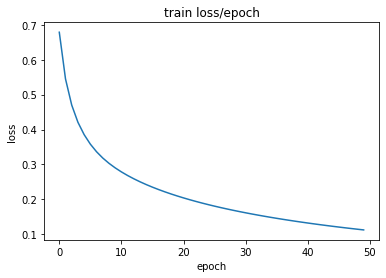

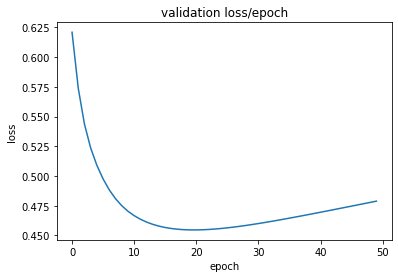

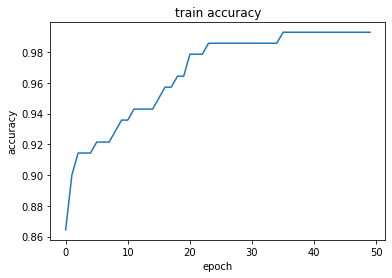

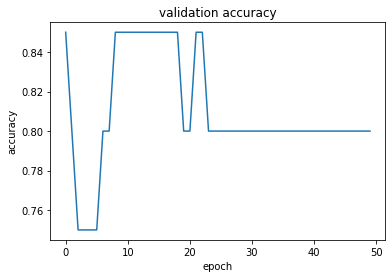

In [ ]:
model = models.__dict__[model_name](
    num_class, pretrained, feature_extractor, progress)

optimizer = get_adam_optimizer(model, lr, weight_decay)

train_loader, val_loader, test_loader = get_dataloader(
    train_set, val_set, test_set, batch_size, collate_fn)

# Training function argument
save_path = Path('./resnet50-feature-extractor')
training_epoch = 50

train_loss, val_loss = train_model(
    model,
    train_loader,
    val_loader,
    test_loader,
    optimizer,
    num_class,
    training_epoch,
    save_path
)

### Testing

In [ ]:
# Get the best epoch model in term of valiation loss
lowest_val_loss_epoch = torch.argmin(torch.tensor(val_loss)).item()

# Creating model, load state_dict, and move to cuda
test_model = models.__dict__[model_name](
    num_class, pretrained, feature_extractor, progress)
state_dict = torch.load(save_path/f'epoch-{lowest_val_loss_epoch}.pth')
test_model.load_state_dict(state_dict)
test_model.cuda()

# Evaluate
accuracy, f1 = evaluate(test_model, test_loader, num_class)
print(f"accuracy: {accuracy}, f1:{f1}")
# Save Best model
torch.save(test_model.state_dict(), str(save_path/f'best_model.pth'))

accuracy: 0.8999999761581421, f1:0.8989899158477783


## Experiment 3

ResNet50 + fine tuning

### Hyperparameter tuning

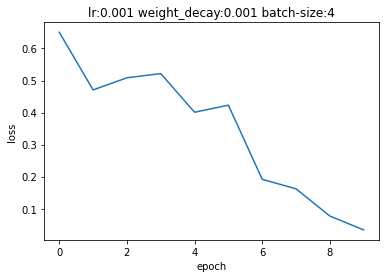

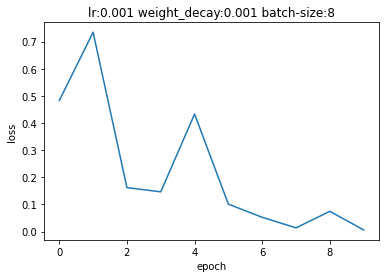

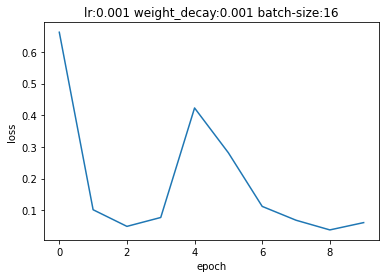

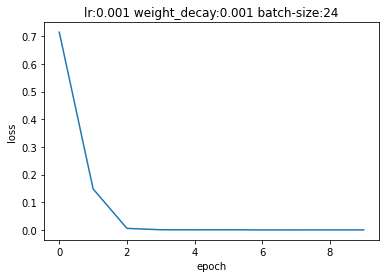

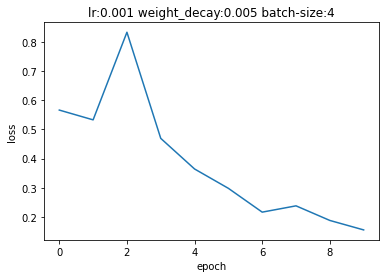

...

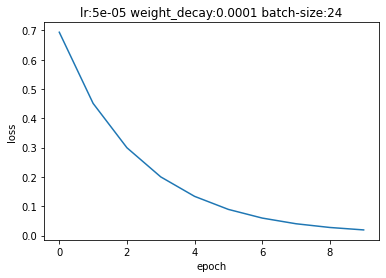

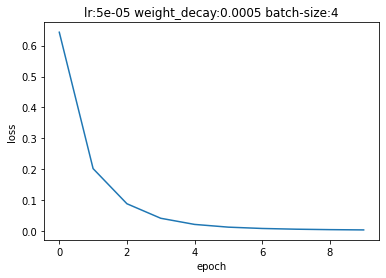

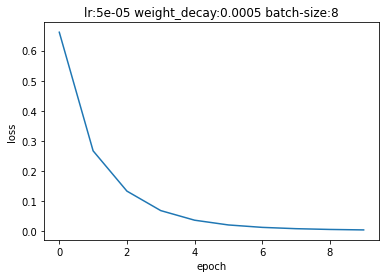

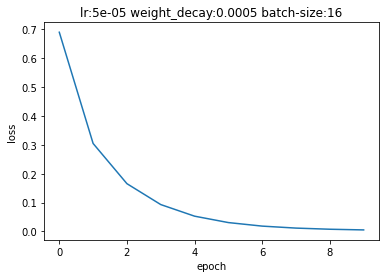

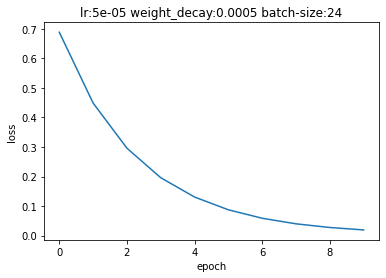

In [ ]:
model_name = 'resnet50'
num_class = 2
pretrained = True
feature_extractor = False
progress = True
# Hyperparameter
hyperparameters = get_hyper_parameters()
validation_epoch = 10

lr, weight_decay, batch_size = hyper_parameters_search(
    model_name,
    num_class,
    pretrained,
    feature_extractor,
    progress,
    hyperparameters,
    val_set,
    validation_epoch)

In [ ]:
print(lr, weight_decay, batch_size)

5e-05 0.0005 24


### Training

epoch 0
	 train loss: 0.6234 	 train acc: 0.9071 	 val loss: 0.5552 	 val acc: 0.7000
epoch 1
	 train loss: 0.2374 	 train acc: 0.9571 	 val loss: 0.4332 	 val acc: 0.8500
epoch 2
	 train loss: 0.0856 	 train acc: 1.0000 	 val loss: 0.3761 	 val acc: 0.8500
epoch 3
	 train loss: 0.0256 	 train acc: 1.0000 	 val loss: 0.3647 	 val acc: 0.9000
epoch 4
	 train loss: 0.0098 	 train acc: 1.0000 	 val loss: 0.3644 	 val acc: 0.9000
epoch 5
	 train loss: 0.0051 	 train acc: 1.0000 	 val loss: 0.3649 	 val acc: 0.9000
epoch 6
	 train loss: 0.0032 	 train acc: 1.0000 	 val loss: 0.3663 	 val acc: 0.9000
epoch 7
	 train loss: 0.0023 	 train acc: 1.0000 	 val loss: 0.3693 	 val acc: 0.9000
epoch 8
	 train loss: 0.0018 	 train acc: 1.0000 	 val loss: 0.3732 	 val acc: 0.9000
epoch 9
	 train loss: 0.0016 	 train acc: 1.0000 	 val loss: 0.3772 	 val acc: 0.9000
epoch 10
	 train loss: 0.0014 	 train acc: 1.0000 	 val loss: 0.3806 	 val acc: 0.9000
epoch 11
	 train loss: 0.0012 	 train acc: 1.0000 	 v

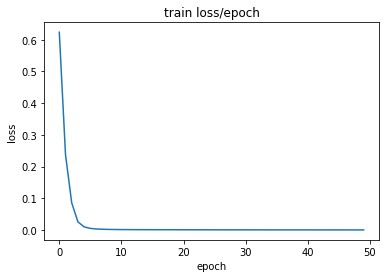

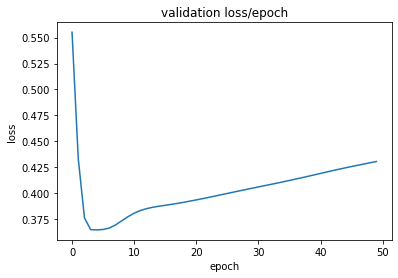

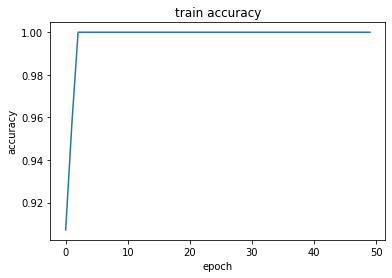

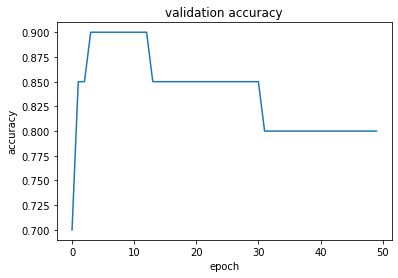

In [ ]:
model = models.__dict__[model_name](
    num_class, pretrained, feature_extractor, progress)

optimizer = get_adam_optimizer(model, lr, weight_decay)

train_loader, val_loader, test_loader = get_dataloader(
    train_set, val_set, test_set, batch_size, collate_fn)

# Training function argument
save_path = Path('./resnet50-fine-tune')
training_epoch = 50

train_loss, val_loss = train_model(
    model,
    train_loader,
    val_loader,
    test_loader,
    optimizer,
    num_class,
    training_epoch,
    save_path
)

### Testing

In [ ]:
# Get the best epoch model in term of valiation loss
lowest_val_loss_epoch = torch.argmin(torch.tensor(val_loss)).item()

# Creating model, load state_dict, and move to cuda
test_model = models.__dict__[model_name](
    num_class, pretrained, feature_extractor, progress)
state_dict = torch.load(save_path/f'epoch-{lowest_val_loss_epoch}.pth')
test_model.load_state_dict(state_dict)
test_model.cuda()

# Evaluate
accuracy, f1 = evaluate(test_model, test_loader, num_class)
print(f"accuracy: {accuracy}, f1:{f1}")
# Save Best model
torch.save(test_model.state_dict(), str(save_path/f'best_model.pth'))

accuracy: 0.800000011920929, f1:0.7999999523162842


## Experiment 4

RegNetY3.2GF + traing from scratch

### Hyperparameter tuning

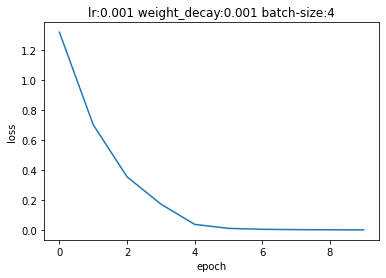

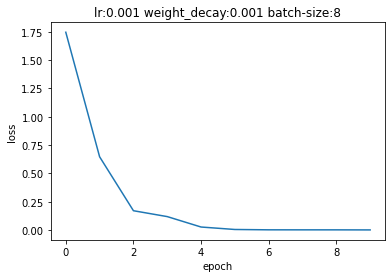

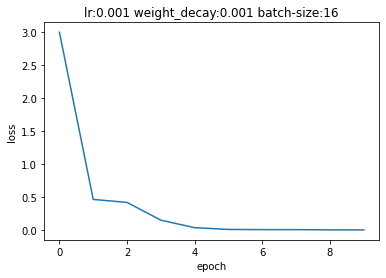

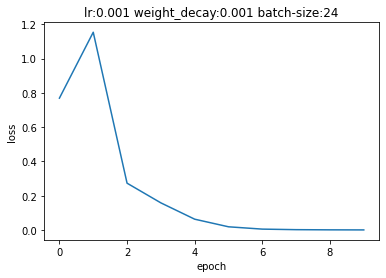

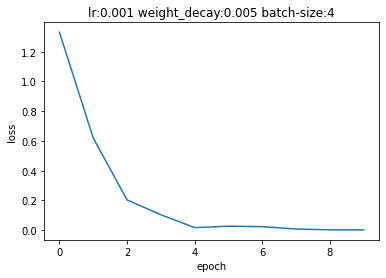

...

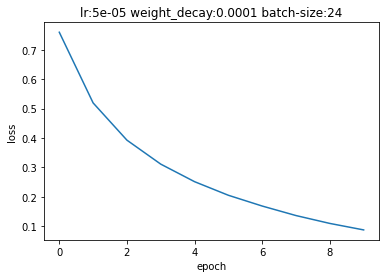

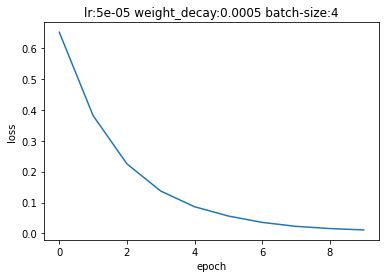

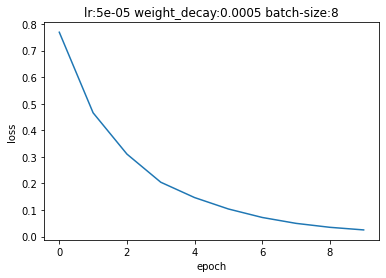

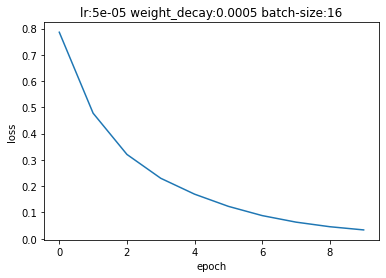

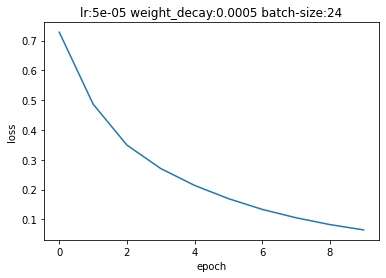

In [ ]:
model_name = 'regnety_3_2_gf'
num_class = 2
pretrained = False
feature_extractor = False
progress = True
# Hyperparameter
hyperparameters = get_hyper_parameters()
validation_epoch = 10

lr, weight_decay, batch_size = hyper_parameters_search(
    model_name,
    num_class,
    pretrained,
    feature_extractor,
    progress,
    hyperparameters,
    val_set,
    validation_epoch)

In [ ]:
print(lr, weight_decay, batch_size)

0.005 0.001 4


### Training

epoch 0
	 train loss: 0.9760 	 train acc: 0.6500 	 val loss: 0.3480 	 val acc: 0.5500
epoch 1
	 train loss: 0.6318 	 train acc: 0.7000 	 val loss: 1.2227 	 val acc: 0.7000
epoch 2
	 train loss: 0.7851 	 train acc: 0.5929 	 val loss: 0.5659 	 val acc: 0.5500
epoch 3
	 train loss: 0.7769 	 train acc: 0.7143 	 val loss: 0.5482 	 val acc: 0.6000
epoch 4
	 train loss: 0.6633 	 train acc: 0.7857 	 val loss: 0.3427 	 val acc: 0.9500
epoch 5
	 train loss: 0.6436 	 train acc: 0.7214 	 val loss: 0.4431 	 val acc: 0.8000
epoch 6
	 train loss: 0.5718 	 train acc: 0.7643 	 val loss: 0.4036 	 val acc: 0.8500
epoch 7
	 train loss: 0.5320 	 train acc: 0.6786 	 val loss: 0.3695 	 val acc: 0.6000
epoch 8
	 train loss: 0.5049 	 train acc: 0.6286 	 val loss: 0.4258 	 val acc: 0.5500
epoch 9
	 train loss: 0.4968 	 train acc: 0.6214 	 val loss: 0.4223 	 val acc: 0.6500
epoch 10
	 train loss: 0.4551 	 train acc: 0.6929 	 val loss: 0.5199 	 val acc: 0.7000
epoch 11
	 train loss: 0.4509 	 train acc: 0.6643 	 v

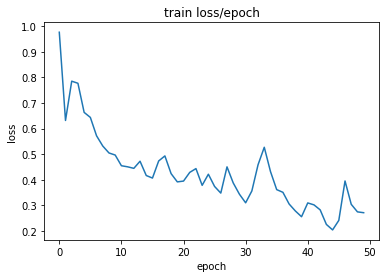

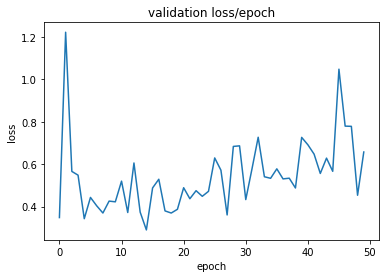

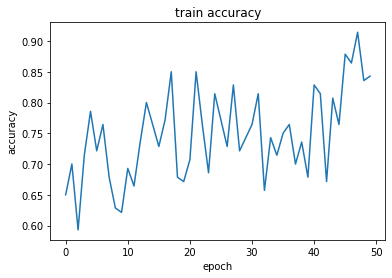

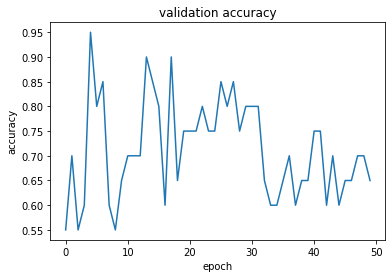

In [ ]:
model = models.__dict__[model_name](
    num_class, pretrained, feature_extractor, progress)

optimizer = get_adam_optimizer(model, lr, weight_decay)

train_loader, val_loader, test_loader = get_dataloader(
    train_set, val_set, test_set, batch_size, collate_fn)

# Training function argument
save_path = Path('./regnety_3_2_gf-from-scratch')
training_epoch = 50

train_loss, val_loss = train_model(
    model,
    train_loader,
    val_loader,
    test_loader,
    optimizer,
    num_class,
    training_epoch,
    save_path
)

### Testing

In [ ]:
# Get the best epoch model in term of valiation loss
lowest_val_loss_epoch = torch.argmin(torch.tensor(val_loss)).item()

# Creating model, load state_dict, and move to cuda
test_model = models.__dict__[model_name](
    num_class, pretrained, feature_extractor, progress)
state_dict = torch.load(save_path/f'epoch-{lowest_val_loss_epoch}.pth')
test_model.load_state_dict(state_dict)
test_model.cuda()

# Evaluate
accuracy, f1 = evaluate(test_model, test_loader, num_class)
print(f"accuracy: {accuracy}, f1:{f1}")
# Save Best model
torch.save(test_model.state_dict(), str(save_path/f'best_model.pth'))

accuracy: 0.75, f1:0.7252747416496277


## Experiment 5

RegNetY3.2GF + feature extractor

### Hyperparameter tuning

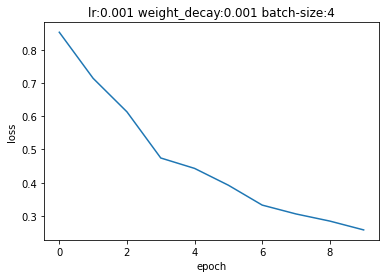

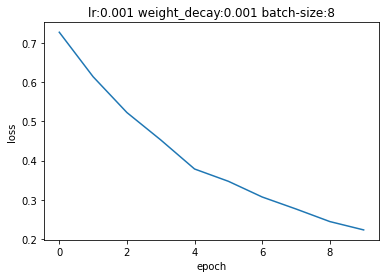

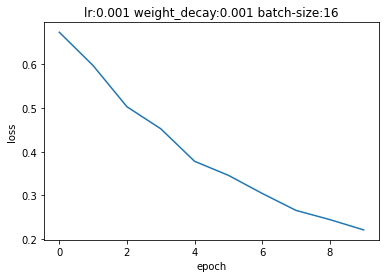

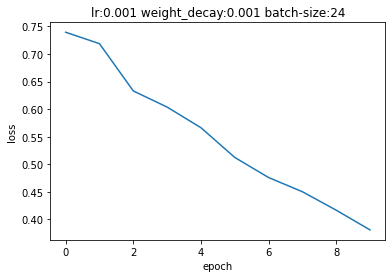

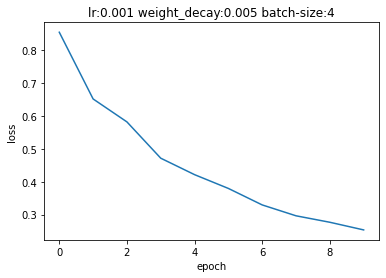

...

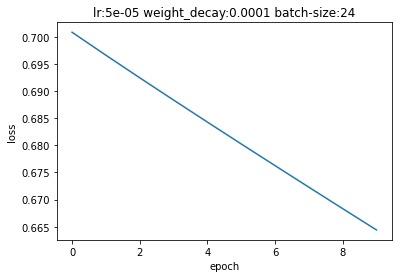

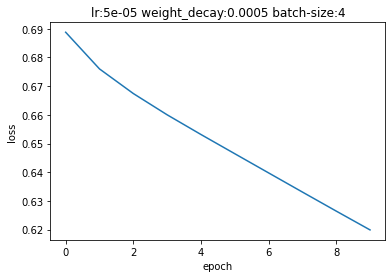

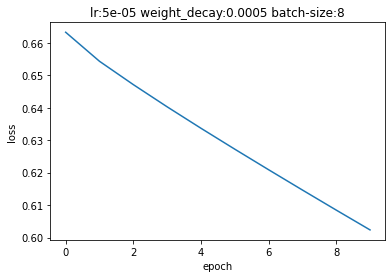

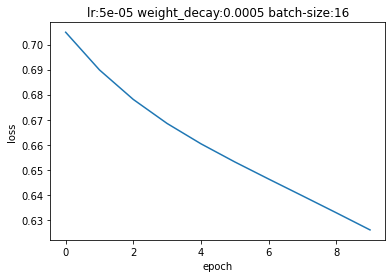

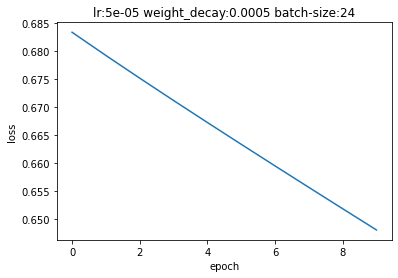

In [ ]:
model_name = 'regnety_3_2_gf'
num_class = 2
pretrained = True
feature_extractor = True
progress = True
# Hyperparameter
hyperparameters = get_hyper_parameters()
validation_epoch = 10

lr, weight_decay, batch_size = hyper_parameters_search(
    model_name,
    num_class,
    pretrained,
    feature_extractor,
    progress,
    hyperparameters,
    val_set,
    validation_epoch)

In [ ]:
print(lr, weight_decay, batch_size)

0.0005 0.0005 8


### Training

epoch 0
	 train loss: 0.6983 	 train acc: 0.7571 	 val loss: 0.6459 	 val acc: 0.7500
epoch 1
	 train loss: 0.5517 	 train acc: 0.8429 	 val loss: 0.5896 	 val acc: 0.7500
epoch 2
	 train loss: 0.4728 	 train acc: 0.8857 	 val loss: 0.5522 	 val acc: 0.8000
epoch 3
	 train loss: 0.4197 	 train acc: 0.9071 	 val loss: 0.5227 	 val acc: 0.8000
epoch 4
	 train loss: 0.3816 	 train acc: 0.9286 	 val loss: 0.4991 	 val acc: 0.8500
epoch 5
	 train loss: 0.3532 	 train acc: 0.9429 	 val loss: 0.4814 	 val acc: 0.8500
epoch 6
	 train loss: 0.3312 	 train acc: 0.9571 	 val loss: 0.4681 	 val acc: 0.8500
epoch 7
	 train loss: 0.3134 	 train acc: 0.9571 	 val loss: 0.4576 	 val acc: 0.8500
epoch 8
	 train loss: 0.2984 	 train acc: 0.9571 	 val loss: 0.4490 	 val acc: 0.9000
epoch 9
	 train loss: 0.2854 	 train acc: 0.9571 	 val loss: 0.4418 	 val acc: 0.9000
epoch 10
	 train loss: 0.2740 	 train acc: 0.9643 	 val loss: 0.4358 	 val acc: 0.9000
epoch 11
	 train loss: 0.2639 	 train acc: 0.9643 	 v

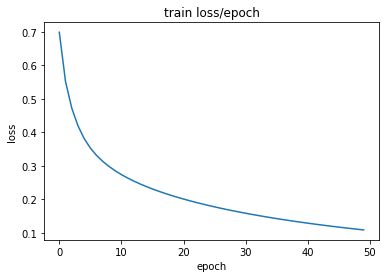

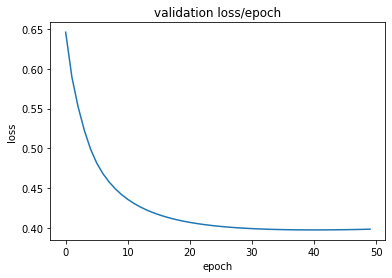

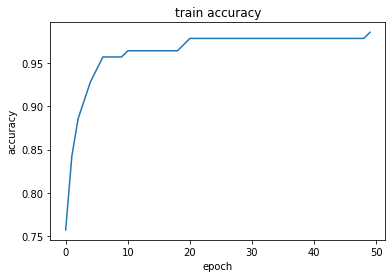

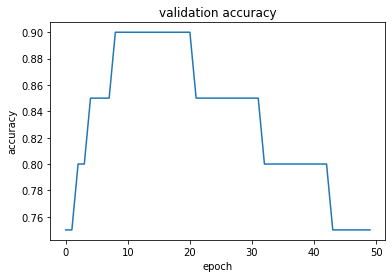

In [ ]:
model = models.__dict__[model_name](
    num_class, pretrained, feature_extractor, progress)

optimizer = get_adam_optimizer(model, lr, weight_decay)

train_loader, val_loader, test_loader = get_dataloader(
    train_set, val_set, test_set, batch_size, collate_fn)

# Training function argument
save_path = Path('./regnety_3_2_gf-feature-extractor')
training_epoch = 50

train_loss, val_loss = train_model(
    model,
    train_loader,
    val_loader,
    test_loader,
    optimizer,
    num_class,
    training_epoch,
    save_path
)

### Testing

In [ ]:
# Get the best epoch model in term of valiation loss
lowest_val_loss_epoch = torch.argmin(torch.tensor(val_loss)).item()

# Creating model, load state_dict, and move to cuda
test_model = models.__dict__[model_name](
    num_class, pretrained, feature_extractor, progress)
state_dict = torch.load(save_path/f'epoch-{lowest_val_loss_epoch}.pth')
test_model.load_state_dict(state_dict)
test_model.cuda()

# Evaluate
accuracy, f1 = evaluate(test_model, test_loader, num_class)
print(f"accuracy: {accuracy}, f1:{f1}")
# Save Best model
torch.save(test_model.state_dict(), str(save_path/f'best_model.pth'))

accuracy: 0.875, f1:0.8742928504943848


## Experiment 6

RegNetY3.2GF + fine tuning

### Hyperparameter tuning

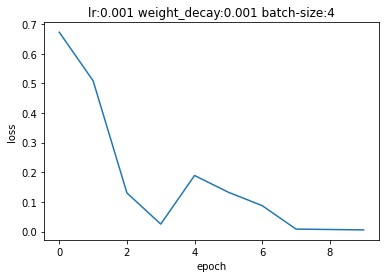

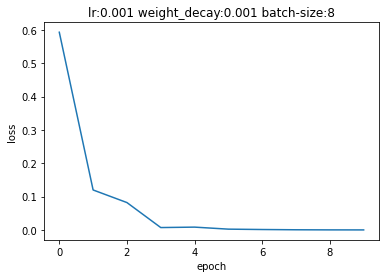

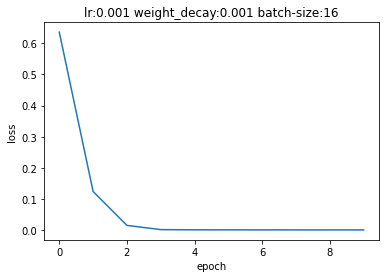

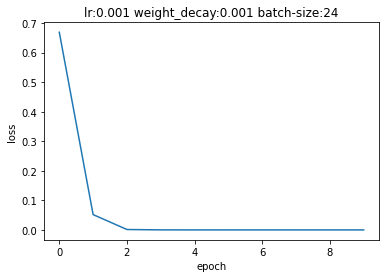

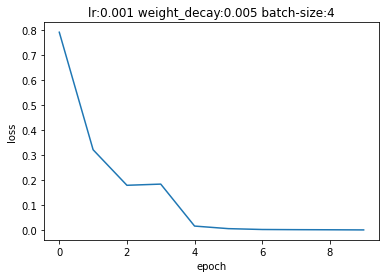

...

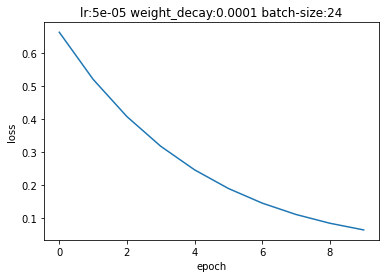

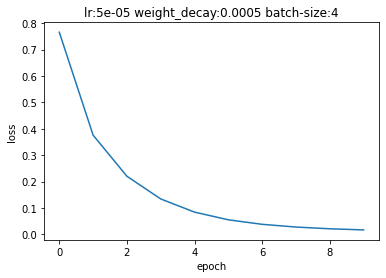

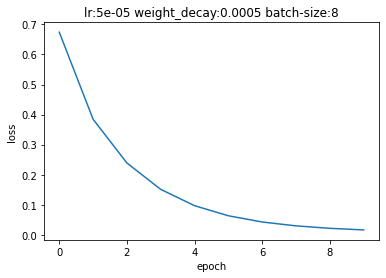

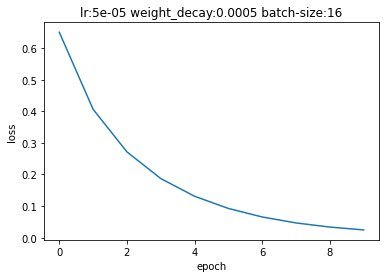

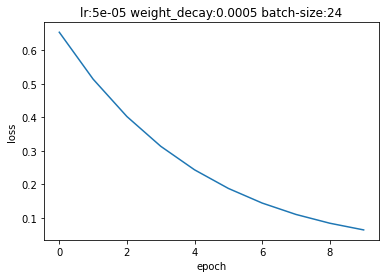

In [ ]:
model_name = 'regnety_3_2_gf'
num_class = 2
pretrained = True
feature_extractor = False
progress = True
# Hyperparameter
hyperparameters = get_hyper_parameters()
validation_epoch = 10

lr, weight_decay, batch_size = hyper_parameters_search(
    model_name,
    num_class,
    pretrained,
    feature_extractor,
    progress,
    hyperparameters,
    val_set,
    validation_epoch)

In [ ]:
print(lr, weight_decay, batch_size)

5e-05 0.0005 24


### Training

epoch 0
	 train loss: 0.6869 	 train acc: 0.6500 	 val loss: 0.5971 	 val acc: 0.5000
epoch 1
	 train loss: 0.3705 	 train acc: 0.9000 	 val loss: 0.4902 	 val acc: 0.6500
epoch 2
	 train loss: 0.2086 	 train acc: 0.9643 	 val loss: 0.4322 	 val acc: 0.7000
epoch 3
	 train loss: 0.1111 	 train acc: 0.9929 	 val loss: 0.4091 	 val acc: 0.7500
epoch 4
	 train loss: 0.0557 	 train acc: 1.0000 	 val loss: 0.4092 	 val acc: 0.7500
epoch 5
	 train loss: 0.0271 	 train acc: 1.0000 	 val loss: 0.4210 	 val acc: 0.8000
epoch 6
	 train loss: 0.0144 	 train acc: 1.0000 	 val loss: 0.4374 	 val acc: 0.8500
epoch 7
	 train loss: 0.0088 	 train acc: 1.0000 	 val loss: 0.4554 	 val acc: 0.8500
epoch 8
	 train loss: 0.0061 	 train acc: 1.0000 	 val loss: 0.4733 	 val acc: 0.8500
epoch 9
	 train loss: 0.0046 	 train acc: 1.0000 	 val loss: 0.4896 	 val acc: 0.8500
epoch 10
	 train loss: 0.0037 	 train acc: 1.0000 	 val loss: 0.5039 	 val acc: 0.8500
epoch 11
	 train loss: 0.0031 	 train acc: 1.0000 	 v

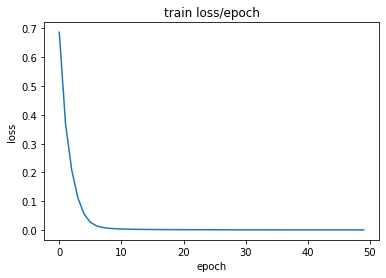

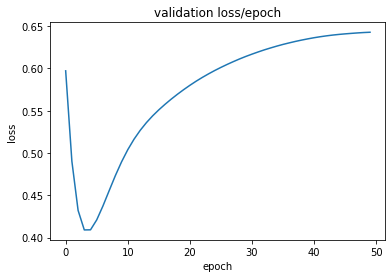

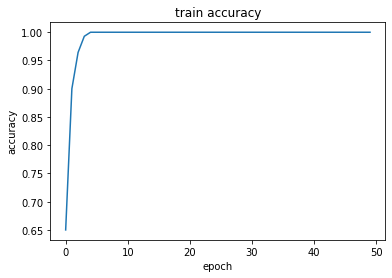

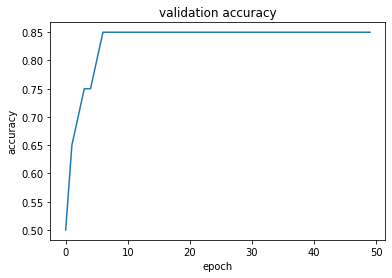

In [ ]:
model = models.__dict__[model_name](
    num_class, pretrained, feature_extractor, progress)

optimizer = get_adam_optimizer(model, lr, weight_decay)

train_loader, val_loader, test_loader = get_dataloader(
    train_set, val_set, test_set, batch_size, collate_fn)

# Training function argument
save_path = Path('./regnety_3_2_gf-fine-tune')
training_epoch = 50

train_loss, val_loss = train_model(
    model,
    train_loader,
    val_loader,
    test_loader,
    optimizer,
    num_class,
    training_epoch,
    save_path
)

### Testing

In [ ]:
# Get the best epoch model in term of valiation loss
lowest_val_loss_epoch = torch.argmin(torch.tensor(val_loss)).item()

# Creating model, load state_dict, and move to cuda
test_model = models.__dict__[model_name](
    num_class, pretrained, feature_extractor, progress)
state_dict = torch.load(save_path/f'epoch-{lowest_val_loss_epoch}.pth')
test_model.load_state_dict(state_dict)
test_model.cuda()

# Evaluate
accuracy, f1 = evaluate(test_model, test_loader, num_class)
print(f"accuracy: {accuracy}, f1:{f1}")
# Save Best model
torch.save(test_model.state_dict(), str(save_path/f'best_model.pth'))

accuracy: 0.925000011920929, f1:0.9238095283508301


# Model Analysis

In the following, we are selecting two models and analyze their perforamnce in saliency map, qualitative example, and confusion matrices.

In [ ]:
from utils import show_saliency_map
from matplotlib import pyplot as plt

def get_model(model_name, training_type):
    save_path = f"./{model_name}-{training_type}"
    visualize_model_path = Path(f"{save_path}/best_model.pth")
    # create model
    visualize_model = models.__dict__[model_name](num_class, False, False, False)
    # load model
    state_dict = torch.load(visualize_model_path)
    visualize_model.load_state_dict(state_dict)
    visualize_model.eval()
    return visualize_model

model1 = get_model('resnet50', 'feature-extractor')
model2 = get_model('regnety_3_2_gf', 'fine-tune')

## Visualization with saliency map

> In this section, we want to look at what the network learned from  training using network visualization. We are going to use saliency maps (straigt from A6) to visualize which part of the image the network thinks determines a clickbait thumbnail.

> One observation is that the saliency map for the fine-tuning type model has a more clustered map and the feature extractor method has a smoother map. It appears that the fine-tuning model pays more attention to high contrast regions, and less attention to low contrast regions. On the other hand, the feature extraction model appears to also utilize image contrast as a main feature, but also has more evenly distributed attention throughout the image. This means that it puts less emphasis than the fine-tuning model on the highest contrast regions, but also utilizes other areas in the image.

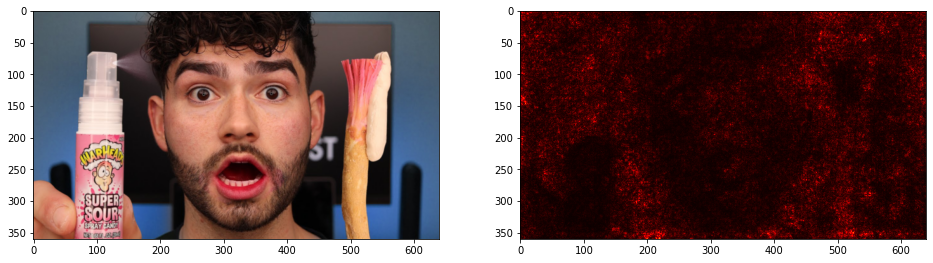

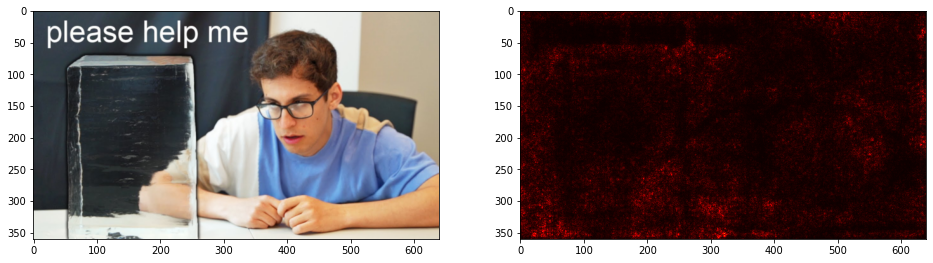

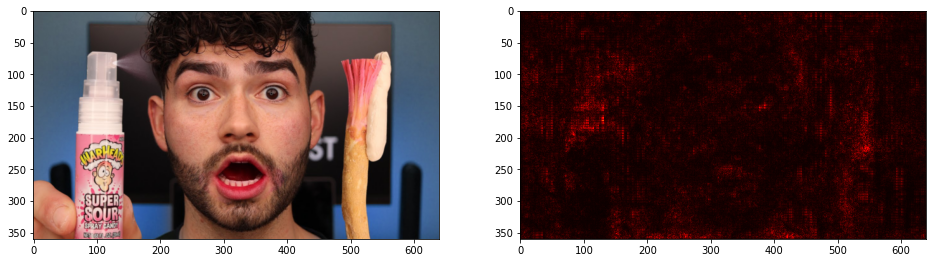

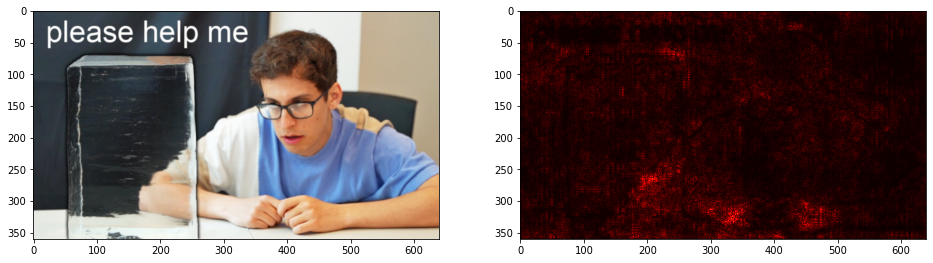

In [ ]:
# get dataloader
dataset_loader = DataLoader(
    thumnail_dataset, batch_size=1, collate_fn=collate_fn)
show_saliency_map(model1, dataset_loader, 2)

dataset_loader = DataLoader(
    thumnail_dataset, batch_size=1, collate_fn=collate_fn)
show_saliency_map(model2, dataset_loader, 2)

## Qualitative example

In [ ]:
from utils import get_qualitative
examples1 = get_qualitative(model1, thumnail_dataset)

> Some true positive, true negative, false positive, false negative for the model 1. One can see that text on the thumbnail can still throw the model off prediction (false positive), making it think the thumbnail is a clickbait.



> *Note that "positive" refers to an image being classified as clickbait.*



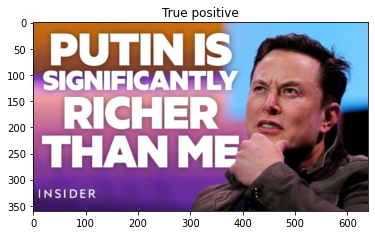

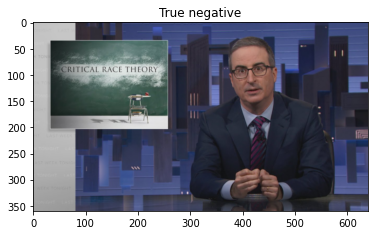

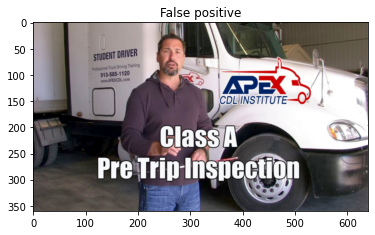

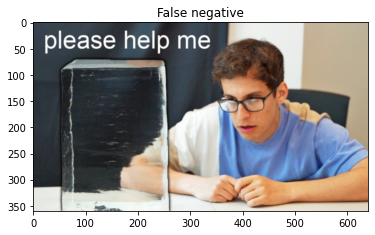

In [ ]:
title = ['True positive', 'True negative', 'False positive', 'False negative']
for title, image in list(zip(title, examples1)):
    plt.figure()
    plt.imshow(image[0].permute(1,2,0))
    plt.title(title)

In [ ]:
examples2 = get_qualitative(model2, thumnail_dataset)


> Some true positive, true negative, false positive, and false negative examples for the model 2. One can see that even though there is text on the second thumbnail, the classifier is able to identify it as a clickbait. However, model 2 is still tricked by the text on thumbnail like model 1 (false positive).

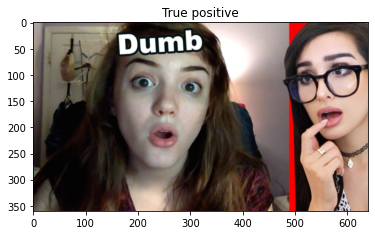

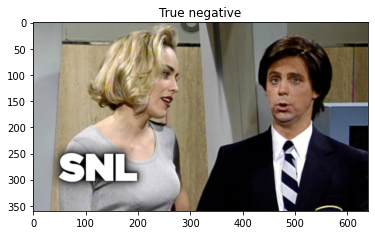

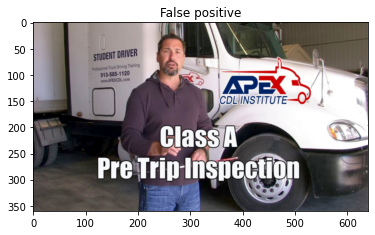

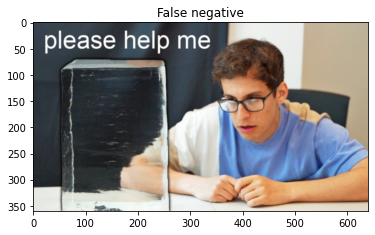

In [ ]:
title = ['True positive', 'True negative', 'False positive', 'False negative']
for title, image in list(zip(title, examples2)):
    plt.figure()
    plt.imshow(image[0].permute(1,2,0))
    plt.title(title)



> We can observe that the falsely classified models both have different types of captions in different areas of the image, which might be the primary reason for the model error.



## Confusion Matrix



> The clickbait label corresponds to 0, while non-clickbait correpsonds to 1.


> For row *i* and column *j* , each image with true label *i* has their predicted label *j* in element *ij*.



> The first matrix corresponds to the ResNet feature extractor model, while the second matrix corresponds to the RegNet fine-tuning (best performing) model.







In [ ]:
from sklearn.metrics import confusion_matrix

@torch.no_grad()
def confusion(model, dataloader, device='cuda'):
    '''
    Evaluate model performance using the dataloader.
    Args:
        model:
            trainable model
        dataloader:
            dataloader for training/val_loader
        num_class:
            number of classes in the dataset
        device:
            cuda or cpu
    Return:
        float, float: accuracy over test set, f1-score over test set
    '''
 
    model.eval()
    predictions = []
    targets = []
    for data, target in dataloader:
        pred = model(data)
        pred = pred.softmax(dim=-1)
        pred = pred.argmax(dim=-1)
        for p in pred:
          if p == 0:
              predictions.append(0)
          else:
              predictions.append(1)
        for t in target:
          if t == 0:
              targets.append(0)
          else:
              targets.append(1)
        
    return confusion_matrix(targets, predictions)

In [ ]:
val_loader = DataLoader(
    val_set, batch_size=32, collate_fn=collate_fn, shuffle=True)
test_loader = DataLoader(
    test_set, batch_size=32, collate_fn=collate_fn, shuffle=True)

confusion_matrix_val1 = confusion(model1, val_loader)
confusion_matrix_val2 = confusion(model2, val_loader)

In [ ]:
print("Confusion matrix Resnet50-feature-extractor")
print(f"TP:{confusion_matrix_val1[0][0]} \t FP:{confusion_matrix_val1[0][1]}")
print(f"FN:{confusion_matrix_val1[1][0]} \t TN:{confusion_matrix_val1[1][1]}")

print("Confusion matrix RegNet-fine-tuning")
print(f"TP:{confusion_matrix_val2[0][0]} \t FP:{confusion_matrix_val2[0][1]}")
print(f"FN:{confusion_matrix_val2[1][0]} \t TN:{confusion_matrix_val2[1][1]}")

Confusion matrix Resnet50-feature-extractor
TP:9 	 FP:1
FN:2 	 TN:8
Confusion matrix RegNet-fine-tuning
TP:7 	 FP:3
FN:2 	 TN:8


#Conclusion / Future work



> Through this project, we learned both about the process of creating datasets as well as the effectiveness of three different training methods on a small dataset. As expected, training from scratch had the lowest performance. We expected the feature extraction method would exceed the fine-tuning models due to the low amount of data, but this wasn’t necessarily the case. The best overall result came from fine-tuning our RegNet model, while our best result for the ResNet models came from the feature extraction method. Since the RegNet had the highest performing model with fine-tuning, but worse performing models for the other methods, it’s difficult to compare the model types directly with only this dataset. Instead, we are able to gain a lot more insight into the training patterns for each method by inspecting their training plots. First, we can clearly see the benefit of transfer learning since both train-from-scratch models had the two lowest performances. Additionally, the fine-tuning models appeared to initially learn effectively, but then quickly overfit. In contrast, the feature extraction models took longer to fit the training set and appeared less prone to quickly over-fitting. 




> Another interesting observation was that the test accuracy was generally higher than the validation accuracy for each of our models, despite the test set being twice the size. This observation could suggest that our test set has a greater resemblance to our training set than the validation set has. The exact reason for this isn’t known, since we tried our best to randomize our data collection and made random splits for preprocessing, but this could simply be a symptom of having a small dataset. A larger dataset would likely have a much larger test set, making it more representative of the general population.





> Due to the abstractness of the concept of clickbait, we were surprised to observe such high performance from all of our models. Our theory prior during data collection was that clickbait images have much higher contrast and are more likely to have strong facial expressions and large text, but we didn’t expect the model to distinguish these images so easily. This could be a result of our dataset’s shortcomings. Since we only have 2 people working on the dataset and have only collected 100 images for each class, it’s possible that we only chose the most extreme examples and possibly had bias towards certain images. With more people working on the dataset and a larger volume of images, we can capture a more complex definition of clickbait by also labeling the more unclear datapoints. Another idea could be using a score for “clickbaitness,” since our current method assumes that something is either clickbait or not. This could be calculated in several different ways, one way could be averaging labels from a group of people for each datapoint. Lastly, we can also try and expand our dataset beyond only thumbnails including face as another technique to try and build a more powerful model.



> Future work with more time and resources would incorporate all these new improvements. We would look to grow our dataset by transitioning to a scoring system, adding more people to help with data collection and provide their own clickbait scores, and including thumbnails without faces as well. This could be done by simply retrieving a random sample of several thumbnails and assigning multiple people to assign a score for each datapoint, and then averaging each of these for the final score.





